/home/dai/GPU-Student-2/Cederic/anaconda3/envs/diffcounter/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dai/GPU-Student-2/Cederic/anaconda3/envs/diffcounter/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


True


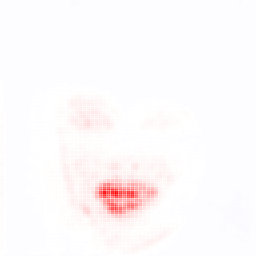

In [37]:
from crp.attribution import CondAttribution
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.image import imgify

from zennit.composites import EpsilonPlusFlat
from zennit.canonizers import SequentialMergeBatchNorm

import torch

from init_classifier import LinearClassifier, VQVAEClassifier, ResNet50Classifier
from data.dataset import ImageDataset, CelebHQAttrDataset

device = "cuda" if torch.cuda.is_available() else "cpu"
model = ResNet50Classifier.load_from_checkpoint("/home/dai/GPU-Student-2/Cederic/DataSciPro/cls_checkpoints/ffhq256.b64res502024-06-02 17:06:41.ckpt",
                                            num_classes = len(CelebHQAttrDataset.id_to_cls))
model.to(device)
model.eval()

data = ImageDataset('/home/dai/GPU-Student-2/Cederic/DataSciPro/data/misclsData_gt0', image_size=256, exts=['jpg', 'JPG', 'png'], do_augment=False, sort_names=True)
image = data[0]['img'].unsqueeze(0).to(model.device)
image.requires_grad = True
cls_id =  CelebHQAttrDataset.cls_to_id['Smiling']

# define LRP rules and canonizers in zennit
composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
# load CRP toolbox
attribution = CondAttribution(model, no_param_grad=True)
# here, each channel is defined as a concept
# or define your own notion!
cc = ChannelConcept()
# get a conditional attribution for channel 50 in layer features.27 wrt. output 1
conditions = [{ 'y': [cls_id]}]

layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear, torch.nn.AdaptiveAvgPool2d, torch.nn.BatchNorm2d])
attr = attribution(image, conditions, composite, record_layer=layer_names)

from crp.image import imgify
print(torch.equal(attr[0], attr.heatmap))
imgify(attr.heatmap, symmetric=True)


In [38]:
attr.activations['resnet50.layer4.2.conv3'].shape, attr.relevances['resnet50.layer4.2.conv3'].shape
rel_c = cc.attribute(attr.relevances['resnet50.layer4.2.conv3'], abs_norm=True)
rel_c.shape
rel_values, concept_ids = torch.topk(rel_c[0], 5)
concept_ids, rel_values*100

(tensor([1846,  699,   82, 1050, 1663], device='cuda:0'),
 tensor([0.5209, 0.5085, 0.5045, 0.5022, 0.4560], device='cuda:0'))

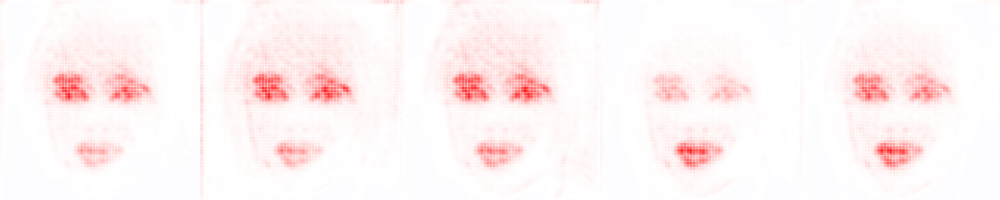

In [39]:
conditions = [{'resnet50.layer4.2.conv3': [id], 'y': [31]} for id in concept_ids]

heatmap, _, _, _ = attribution(image, conditions, composite)

imgify(heatmap, symmetric=True, grid=(1, len(concept_ids)))

5 most important concepts in the last conv layer


In [40]:
from torch.utils.data import DataLoader, Subset

data_path = '/home/dai/GPU-Student-2/Cederic/pjds_group8/datasets/celebahq256.lmdb'
attr_path = '/home/dai/GPU-Student-2/Cederic/pjds_group8/datasets/celeba_anno/CelebAMask-HQ-attribute-anno.txt'
image_size = 256
data = CelebHQAttrDataset(path=data_path, image_size=image_size, attr_path=attr_path, do_augment=False)
train_size = int(0.8 * len(data))
val_size = int(0.1 * len(data))
test_size = len(data) - train_size - val_size
train_dataset = Subset(data, range(train_size))
val_dataset = Subset(data, range(train_size, train_size + val_size))
test_dataset = Subset(data, range(train_size + val_size, train_size + val_size + test_size))

#use just test data

cc = ChannelConcept()

layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
layer_map = {layer : cc for layer in layer_names}

attribution = CondAttribution(model)

from crp.visualization import FeatureVisualization
fv_path = "/home/dai/GPU-Student-2/Cederic/DataSciPro/xai_analysis_crp"
fv = FeatureVisualization(attribution, val_dataset, layer_map, path=fv_path)
saved_files = fv.run(composite, 0, len(test_dataset), 32, 100)

/home/dai/GPU-Student-2/Cederic/DataSciPro/data/dataset.py:143: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.df = pd.read_csv(f, delim_whitespace=True)


Running Analysis...


  2%|▏         | 2/94 [00:00<00:40,  2.26it/s]

100%|██████████| 94/94 [00:50<00:00,  1.86it/s]


100%|██████████| 108/108 [00:00<00:00, 864.69it/s]


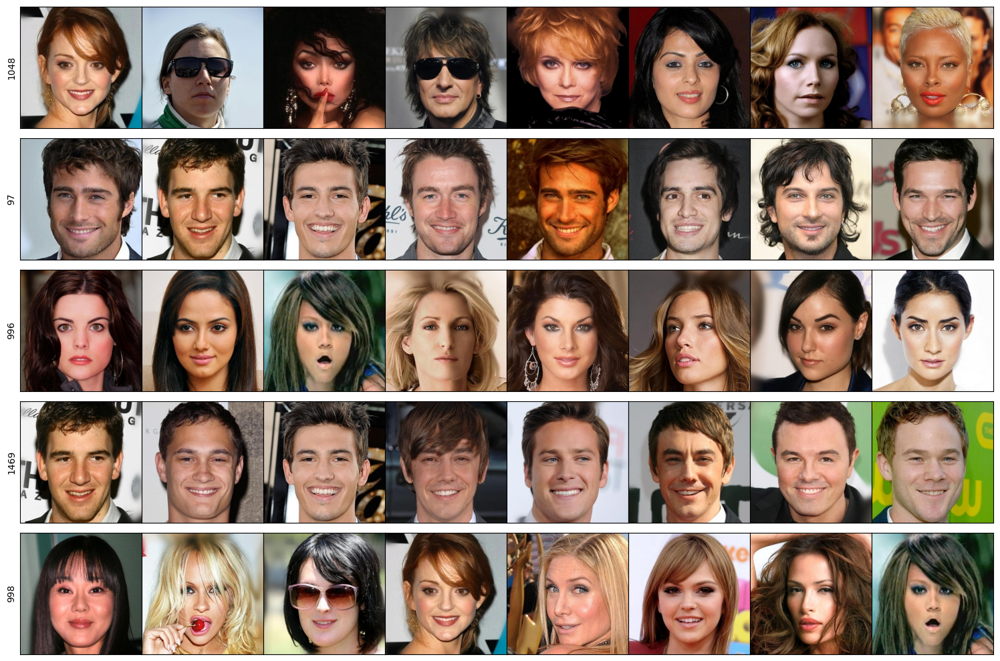

In [31]:
%matplotlib inline
from crp.image import plot_grid

ref_c = fv.get_max_reference(concept_ids.tolist(), "resnet50.layer4.2.conv3", "relevance", (0, 8))

plot_grid(ref_c, figsize=(15, 10), padding=False)

In the previous notebook, we discovered the 5 most important concepts in classifying the lizard. Now let's visualize the 8 most representative input samples for each of these concepts using Relevance Maximization.

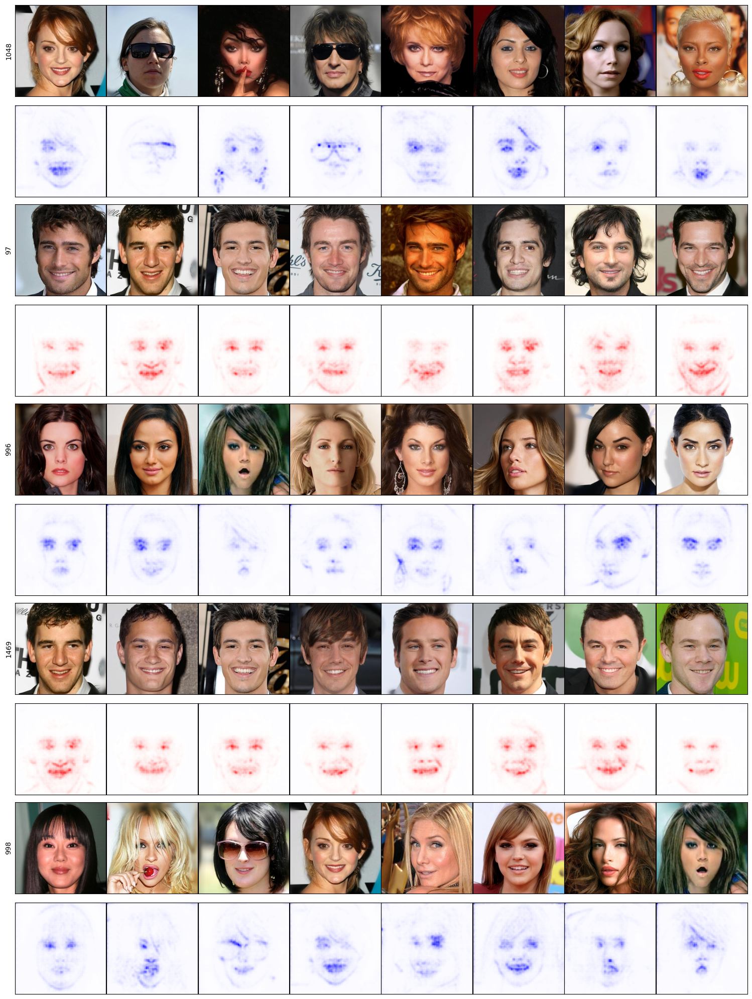

In [33]:
ref_c = fv.get_max_reference(concept_ids.tolist(), "resnet50.layer4.2.conv3", "relevance", (0, 8), composite=composite, plot_fn=None)

plot_grid(ref_c, figsize=(15, 20))

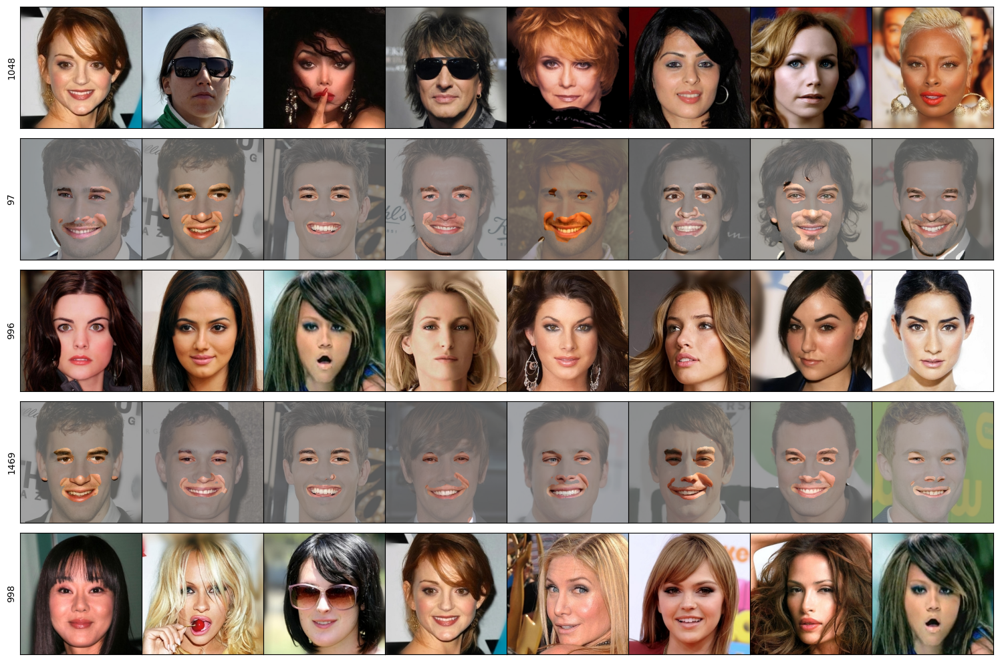

In [35]:
from crp.image import vis_opaque_img

ref_c = fv.get_max_reference(concept_ids.tolist(), "resnet50.layer4.2.conv3", "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c, cmap="bwr", symmetric=True, figsize=(15, 10))

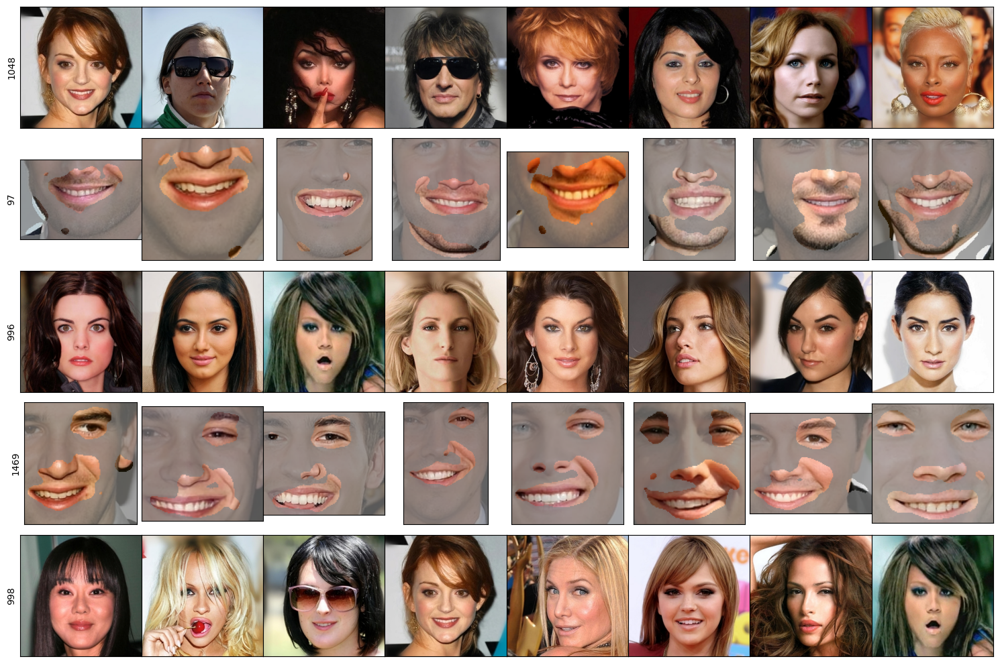

In [36]:
ref_c = fv.get_max_reference(concept_ids.tolist(), "resnet50.layer4.2.conv3", "relevance", (0, 8), rf=True, composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c, figsize=(15, 10), padding=False)